In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import pylab as pl
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
countries = pd.read_csv('datasets/cluster_analysis shorten.csv')

## kNN Imputation

In [4]:
from sklearn.impute import KNNImputer
from numpy import isnan
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num = countries.select_dtypes(include=numerics).columns
# split into input and output elements
X = countries[num].values
# print total missing
print('Missing: %d' % sum(isnan(X).flatten()))
# define imputer
imputer = KNNImputer()
# fit on the dataset
imputer.fit(X)
# transform the dataset
Xtrans = imputer.transform(X)
# print total missing
print('Missing: %d' % sum(isnan(Xtrans).flatten()))
total_df = pd.DataFrame()
total_df = total_df.append(pd.DataFrame(Xtrans, columns = num), ignore_index = True)

Missing: 274
Missing: 0


## Scaling

In [5]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

data_sc = pd.DataFrame(scaler.fit_transform(total_df), columns = countries.select_dtypes(include=numerics).columns)

In [6]:
categories = {
    'Socio-economic': [
        'GDP_per_capita', 'Health Exp', 'Alcohol consumption', 'Cigarette consumption', 
        'Life Expectancy', 'Income Gini', 'UHC coverage', 'Population', 'Population Density'
    ],
    'Disease Prevalence': [
        'Tuberculosis cases', 'Cardiovascular', 'Diabetes', 'Respiratory', 'Asthma'
    ],
    'Environmental': [
        'PM2.5 exposure', 'Pollution Death Rate', 'EPI score',
        'Sanitation and Drinking Water', 'Unsafe Water for Drinking'
    ],
    'Political': [
        'Democracy Index', 'Corruption index', 'Human Development Index'
    ]
}

## EDA

In [8]:
df = data_sc.copy()

<AxesSubplot:xlabel='UHC coverage', ylabel='Density'>

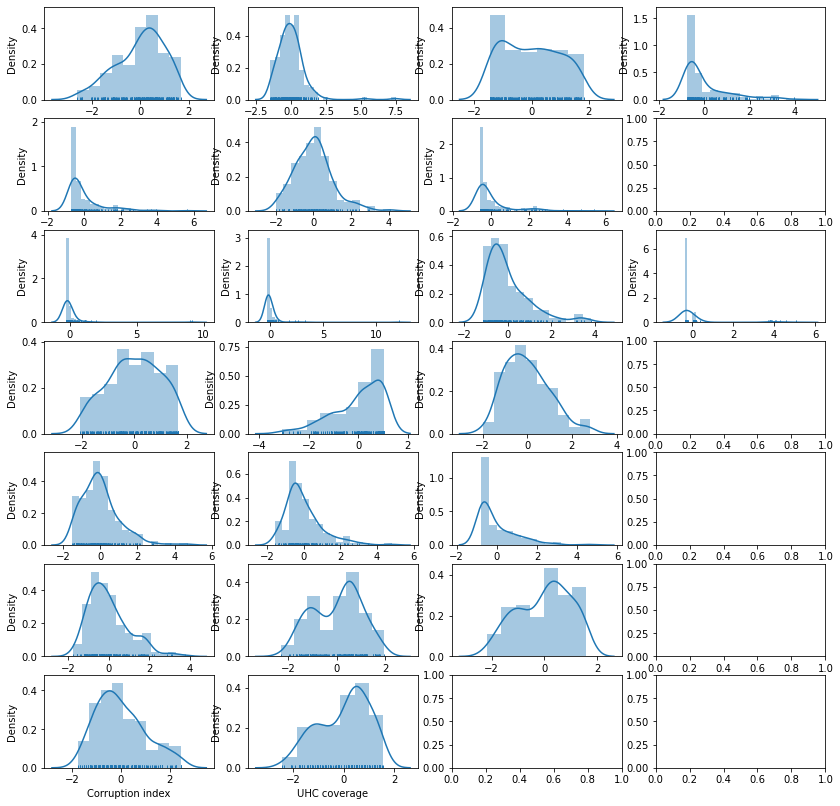

In [8]:
# Histograms

%matplotlib inline
# Univariate Histograms
f, axes = plt.subplots(7,4, figsize=(14, 14))
sns.distplot(df["Life Expectancy"], rug=True, ax=axes[0, 0])
sns.distplot(df["Cigarette consumption"], rug=True, ax=axes[0, 1])
sns.distplot(df["Alcohol consumption"], rug=True, ax=axes[0, 2])
sns.distplot(df["Tuberculosis cases"], rug=True, ax=axes[0, 3])
sns.distplot(df["GDP_per_capita"], rug=True, ax=axes[1, 0])
sns.distplot(df["Income Gini"], rug=True, ax=axes[1, 1])
sns.distplot(df["Health Exp"], rug=True, ax=axes[1, 2])
sns.distplot(df["Population"], rug=True, ax=axes[2, 0])
sns.distplot(df["Population Density"], rug=True, ax=axes[2, 1])
sns.distplot(df["PM2.5 exposure"], rug=True, ax=axes[2, 2])
sns.distplot(df["Pollution Death Rate"], rug=True, ax=axes[2, 3])
sns.distplot(df["Sanitation and Drinking Water"], rug=True, ax=axes[3, 0])
sns.distplot(df["Unsafe Water for Drinking"], rug=True, ax=axes[3, 1])
sns.distplot(df["EPI score"], ax=axes[3, 2])
sns.distplot(df["Cardiovascular"], rug=True, ax=axes[4, 0])
sns.distplot(df["Diabetes"], rug=True, ax=axes[4, 1])
sns.distplot(df["Respiratory"], ax=axes[4, 2])
sns.distplot(df["Asthma"], rug=True, ax=axes[5, 0])
sns.distplot(df["Democracy Index"], rug=True, ax=axes[5, 1])
sns.distplot(df["Human Development Index"], ax=axes[5, 2])
sns.distplot(df["Corruption index"], rug=True, ax=axes[6, 0])
sns.distplot(df["UHC coverage"], rug=True, ax=axes[6, 1])

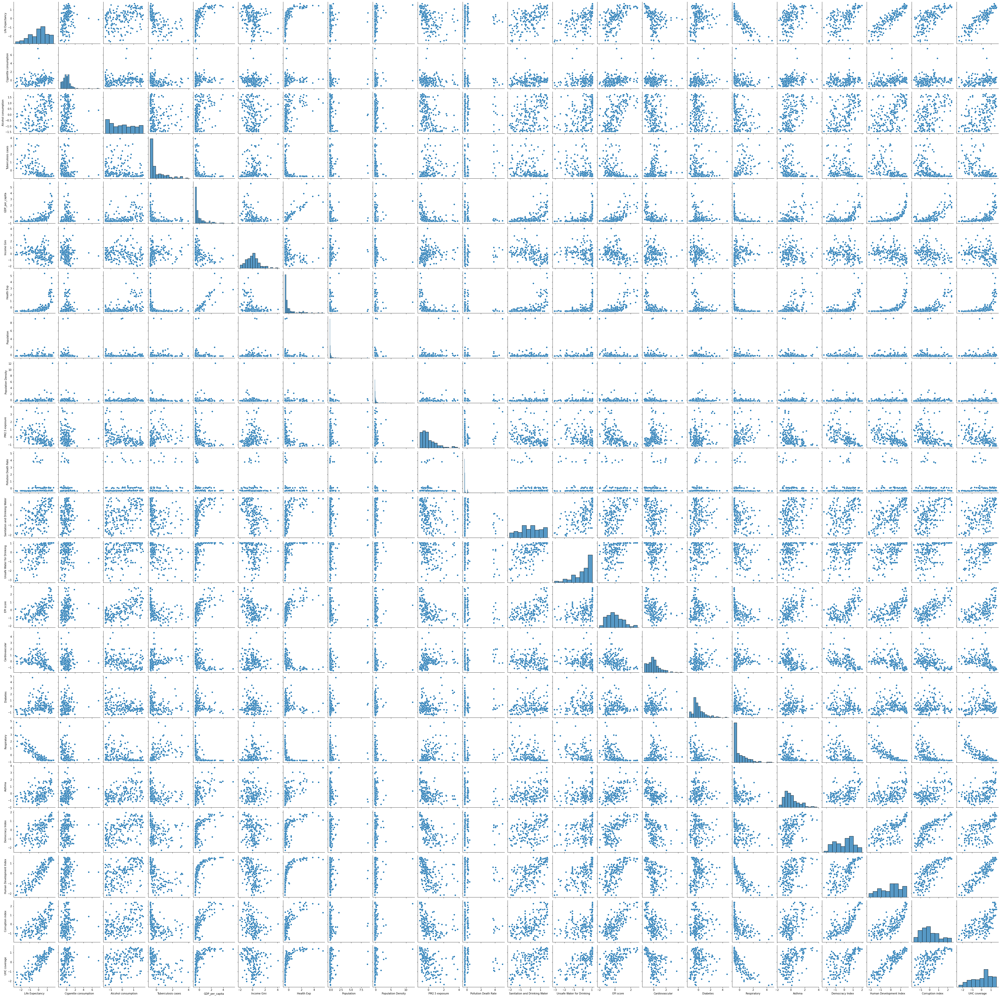

In [9]:
sns.pairplot(df)

## PCA for future clustering

In [43]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 0.95)
reduced = pca.fit_transform(df)
pca.explained_variance_ratio_

array([0.4125808 , 0.08467915, 0.06556108, 0.06060908, 0.05527071,
       0.04851398, 0.04225925, 0.03905802, 0.03227358, 0.02606235,
       0.02396834, 0.02242464, 0.01746821, 0.01607254, 0.01155113])

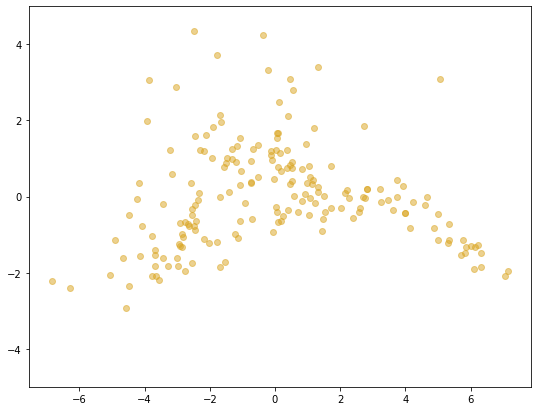

In [35]:
plt.figure(figsize = (9,7))
plt.scatter(reduced[:,0],reduced[:,1], c='goldenrod',alpha=0.5)
plt.ylim(-5,5)
plt.show()

## K-Means Clustering

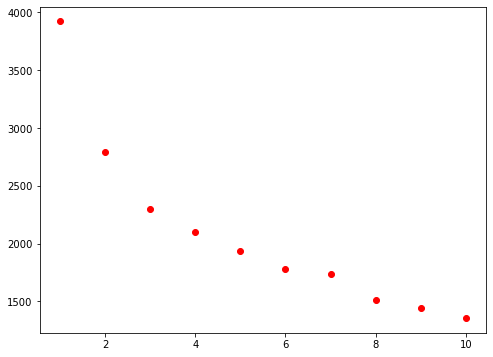

In [36]:
# K-Means Clustering:
cl = 10
corte = 0.1

anterior = 100000000000000
cost = [] 
K_best = cl

for k in range (1, cl+1):
    # Create a kmeans model on our data, using k clusters.  random_state helps ensure that the algorithm returns the same results each time.
    model = KMeans(
        n_clusters=k, 
        init='k-means++', #'random',
        n_init=10,
        max_iter=300,
        tol=1e-04,
        random_state=101)

    model = model.fit(reduced)

    # These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
    labels = model.labels_
 
    # Sum of distances of samples to their closest cluster center
    interia = model.inertia_
    if (K_best == cl) and (((anterior - interia)/anterior) < corte): K_best = k - 1
    cost.append(interia)
    anterior = interia

plt.figure(figsize=(8, 6))
plt.scatter(range (1, cl+1), cost, c='red')
plt.show()

In [37]:
K_best

3

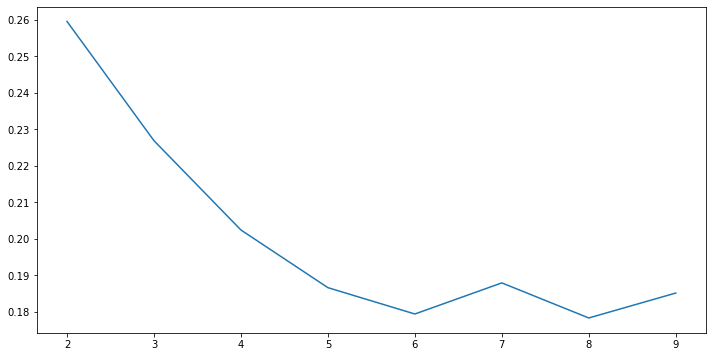

In [38]:
from sklearn.metrics import silhouette_score

sse_ = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k).fit(reduced)
    sse_.append([k, silhouette_score(reduced, kmeans.labels_)])
    
plt.plot(pd.DataFrame(sse_)[0], pd.DataFrame(sse_)[1])
plt.show()

In [39]:
# silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(reduced)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(reduced, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.2862363254598345
For n_clusters=3, the silhouette score is 0.22787468115005607
For n_clusters=4, the silhouette score is 0.24037294308376292
For n_clusters=5, the silhouette score is 0.1861822904549456
For n_clusters=6, the silhouette score is 0.18785099149233414
For n_clusters=7, the silhouette score is 0.1806730344154708
For n_clusters=8, the silhouette score is 0.19183509380258051


In [40]:
kmean= KMeans(K_best)
kmean.fit(reduced)
labels=kmean.labels_

In [46]:
clusters=pd.concat([total_df, pd.DataFrame({'cluster':labels})], axis=1)
clusters.head()

,Life Expectancy,Cigarette consumption,Alcohol consumption,Tuberculosis cases,GDP_per_capita,Income Gini,Health Exp,Population,Population Density,PM2.5 exposure,...,EPI score,Cardiovascular,Diabetes,Respiratory,Asthma,Democracy Index,Human Development Index,Corruption index,UHC coverage,cluster
0,58.095000,20.30,5.774,232.0,15015.799649,0.4410,22.638190,11381377.0,18.01,45.58,...,41.14,231.546557,6.5,19.0,4.048206,4.412,0.4330,11.0,32.0,2
1,73.651000,25.90,0.190,19.0,18003.981269,0.3680,1237.870196,18275704.0,99.52,43.76,...,44.02,491.127714,14.9,1.8,3.444039,1.430,0.5670,13.0,56.0,1
2,72.947518,11.60,7.230,47.0,7559.975039,0.3682,440.169860,72172.0,96.23,19.49,...,51.20,267.111202,11.7,1.4,7.177538,6.650,0.7420,55.0,67.0,1
3,68.002000,33.58,2.510,75.0,3476.650895,0.3682,415.198270,116255.0,166.08,11.28,...,37.40,560.229290,15.6,4.9,3.265197,6.650,0.6200,51.8,48.0,1
4,72.453000,14.90,4.160,523.0,13056.884580,0.3908,1122.642322,25887045.0,214.99,32.01,...,38.50,352.910430,8.6,2.9,3.914215,1.080,0.5796,16.0,68.0,2


In [47]:
clusters['iso'] = countries['Country code']
clusters

,Life Expectancy,Cigarette consumption,Alcohol consumption,Tuberculosis cases,GDP_per_capita,Income Gini,Health Exp,Population,Population Density,PM2.5 exposure,...,Cardiovascular,Diabetes,Respiratory,Asthma,Democracy Index,Human Development Index,Corruption index,UHC coverage,cluster,iso
0,58.095000,20.30,5.774,232.0,15015.799649,0.4410,22.638190,11381377.0,18.01,45.58,...,231.546557,6.5,19.0,4.048206,4.412,0.4330,11.0,32.0,2,SSD
1,73.651000,25.90,0.190,19.0,18003.981269,0.3680,1237.870196,18275704.0,99.52,43.76,...,491.127714,14.9,1.8,3.444039,1.430,0.5670,13.0,56.0,1,SYR
2,72.947518,11.60,7.230,47.0,7559.975039,0.3682,440.169860,72172.0,96.23,19.49,...,267.111202,11.7,1.4,7.177538,6.650,0.7420,55.0,67.0,1,DMA
3,68.002000,33.58,2.510,75.0,3476.650895,0.3682,415.198270,116255.0,166.08,11.28,...,560.229290,15.6,4.9,3.265197,6.650,0.6200,51.8,48.0,1,FSM
4,72.453000,14.90,4.160,523.0,13056.884580,0.3908,1122.642322,25887045.0,214.99,32.01,...,352.910430,8.6,2.9,3.914215,1.080,0.5796,16.0,68.0,2,PRK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,55.018000,14.70,6.190,219.0,2085.030765,0.3510,71.465730,211400704.0,232.11,71.80,...,235.652017,3.6,18.3,3.678255,4.110,0.5390,24.0,44.0,2,NGA
182,75.693170,18.80,6.430,12.0,6720.896285,0.3300,436.887180,2065092.0,81.88,29.73,...,568.703681,6.1,0.7,5.576464,6.030,0.7740,39.0,68.0,1,MKD
183,74.363000,23.20,7.010,48.0,5400.103826,0.4350,388.393250,7219641.0,18.17,11.91,...,187.905196,7.5,2.3,5.707235,5.860,0.7280,30.0,61.0,1,PRY
184,74.353660,19.60,12.340,64.0,14861.909170,0.3480,738.558170,19115146.0,83.08,14.61,...,379.626398,6.5,2.2,4.468826,6.430,0.8280,45.0,71.0,1,ROU


## Visualisation Part

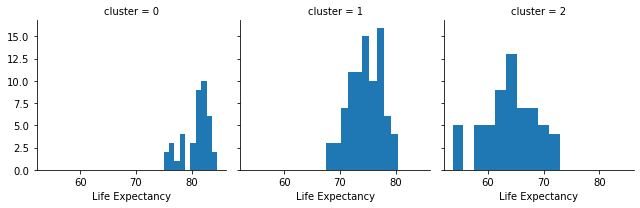

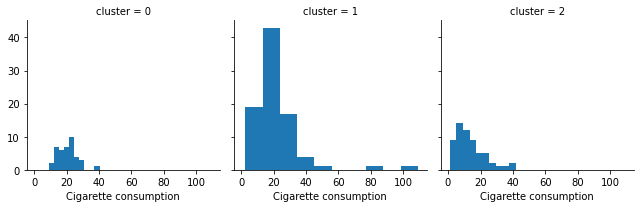

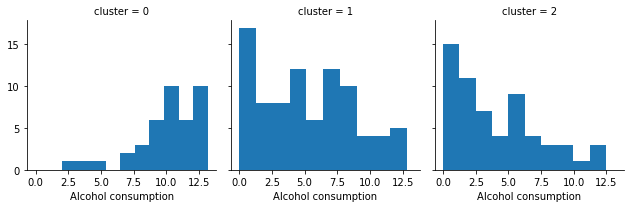

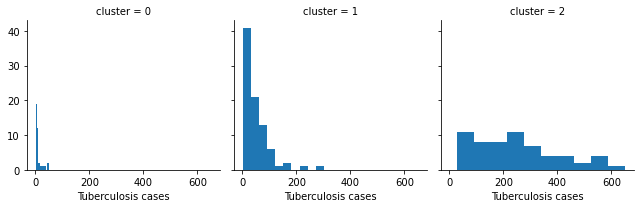

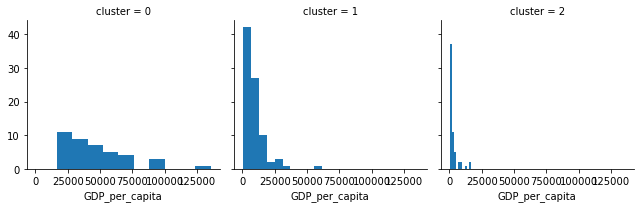

...

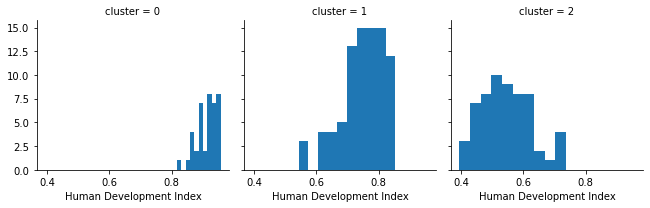

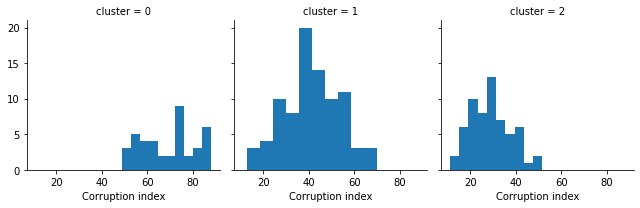

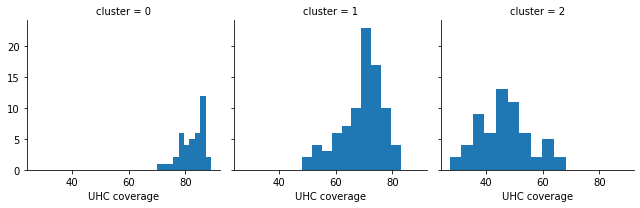

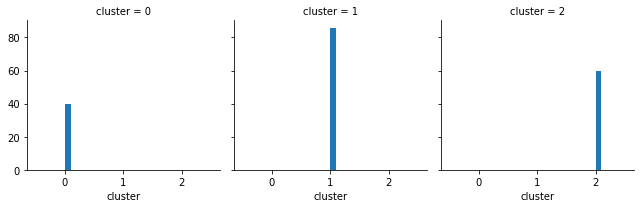

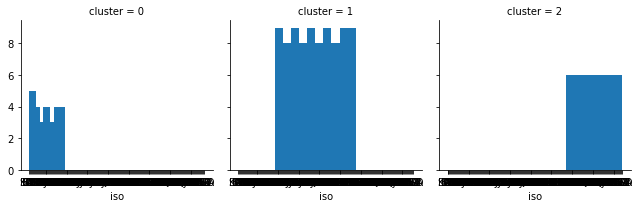

In [48]:
for c in clusters:
    grid= sns.FacetGrid(clusters, col='cluster')
    grid.map(plt.hist, c)

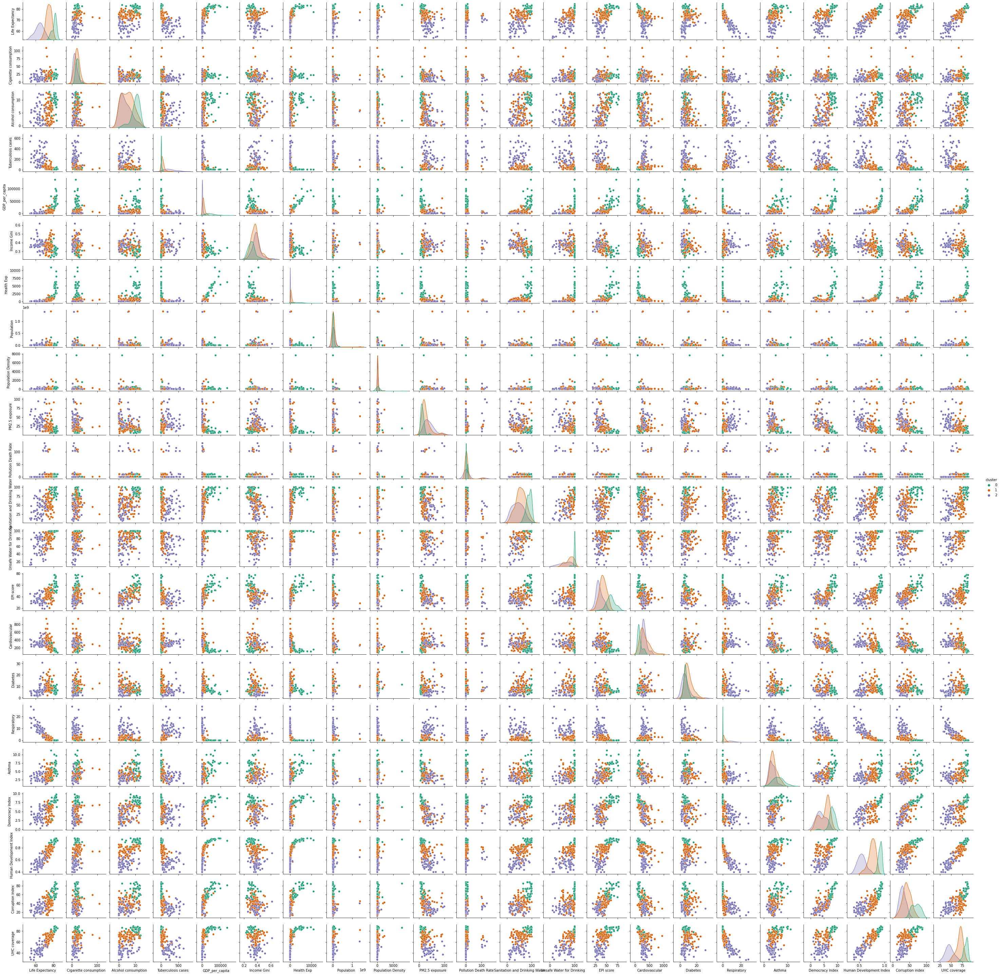

In [50]:
# Call Seaborn's pairplot to visualize our KMeans clustering on the PCA projected data

clustered_pairplot = sns.pairplot(pd.concat([total_df, pd.DataFrame({'cluster':labels})], axis=1), 
                                  hue='cluster', palette= 'Dark2', diag_kind='kde',size=1.85)
clustered_pairplot.figure.savefig("clustered_pairplot_out (10.01).png")

In [37]:
#data_with_cl = pd.concat([total_df, pd.DataFrame({'cluster':labels}), countries['Country code']], axis=1)

## Covid data

In [108]:
covid = pd.read_csv('datasets/covid data.csv')

In [109]:
covid = covid.dropna()

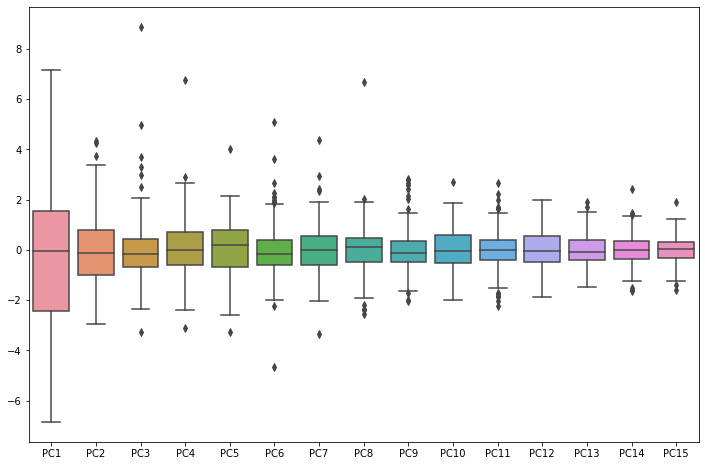

In [99]:
# !!!!
# 186 rows

reduced = pd.DataFrame(reduced)

pcs_df15 = pd.DataFrame({'PC1':reduced[0],'PC2':reduced[1],'PC3':reduced[2],'PC4':reduced[3],
                         'PC5':reduced[4], 'PC6':reduced[5],'PC7':reduced[6],'PC8':reduced[7],'PC9':reduced[8],
                         'PC10':reduced[9], 'PC11':reduced[10],'PC12':reduced[11],'PC13':reduced[12],
                         'PC14':reduced[13],'PC15':reduced[14]
                       })
fig = plt.figure(figsize = (12,8))
sns.boxplot(data=pcs_df15)
plt.show()

In [101]:
#len(pcs_df15)

186

In [103]:
dat4=pcs_df15
dat4.index = pd.RangeIndex(len(dat4.index))
dat_km = pd.concat([dat4, pd.Series(labels)], axis=1)
dat_km.columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6', 'PC7','PC8','PC9','PC10',
                  'PC11', 'PC12','PC13','PC14','PC15', 'ClusterID']
dat_km

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,ClusterID
0,-3.547856,-2.194992,0.209907,1.084705,0.659622,-1.252578,0.659685,-0.100240,1.442988,-0.354188,0.672016,0.538804,-0.864809,-1.614146,-0.735871,2
1,-1.655208,1.966289,-1.559420,0.714047,0.302814,-0.636463,0.798440,-0.612779,0.044683,-1.153230,-0.058782,-0.424042,0.242128,0.014737,-0.353139,1
2,0.704431,-0.402805,-0.340502,-0.787130,0.629657,1.195960,-0.386689,-0.931604,-0.480808,0.003132,-0.675849,1.165795,0.371848,0.375595,-0.227454,1
3,-1.509618,0.878586,-1.301126,-0.531141,-0.318473,1.809639,0.204884,-0.817291,0.849475,0.882926,-0.824423,-0.599390,0.841589,-1.225520,0.358156,1
4,-2.352297,-0.083318,0.372133,0.049377,-0.187765,-0.139462,-0.311243,0.036745,1.177891,-1.543949,0.512330,-0.948885,0.052988,2.428903,-0.583708,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,-4.655660,-1.610403,1.505428,0.918940,0.878680,0.121008,1.921395,0.438135,-0.513474,0.916152,0.155337,1.001239,0.405669,0.131567,0.459860,2
182,0.031812,1.218772,1.026888,-2.071703,-2.254618,1.901973,0.619120,0.630794,-1.292287,-1.991093,-1.207325,-0.303683,-0.715443,-0.945570,-1.599921,1
183,0.103463,-0.661584,-0.607470,-1.349677,0.856353,-0.217961,-0.550486,0.100085,0.252810,-0.242803,-0.152859,0.454529,-0.417929,0.019658,0.519236,1
184,1.731174,-0.292430,-0.366791,-0.443190,-1.479083,-0.582364,-0.181476,0.347693,0.577066,-0.244081,-0.001763,0.872319,0.400056,-0.370123,-0.246141,1


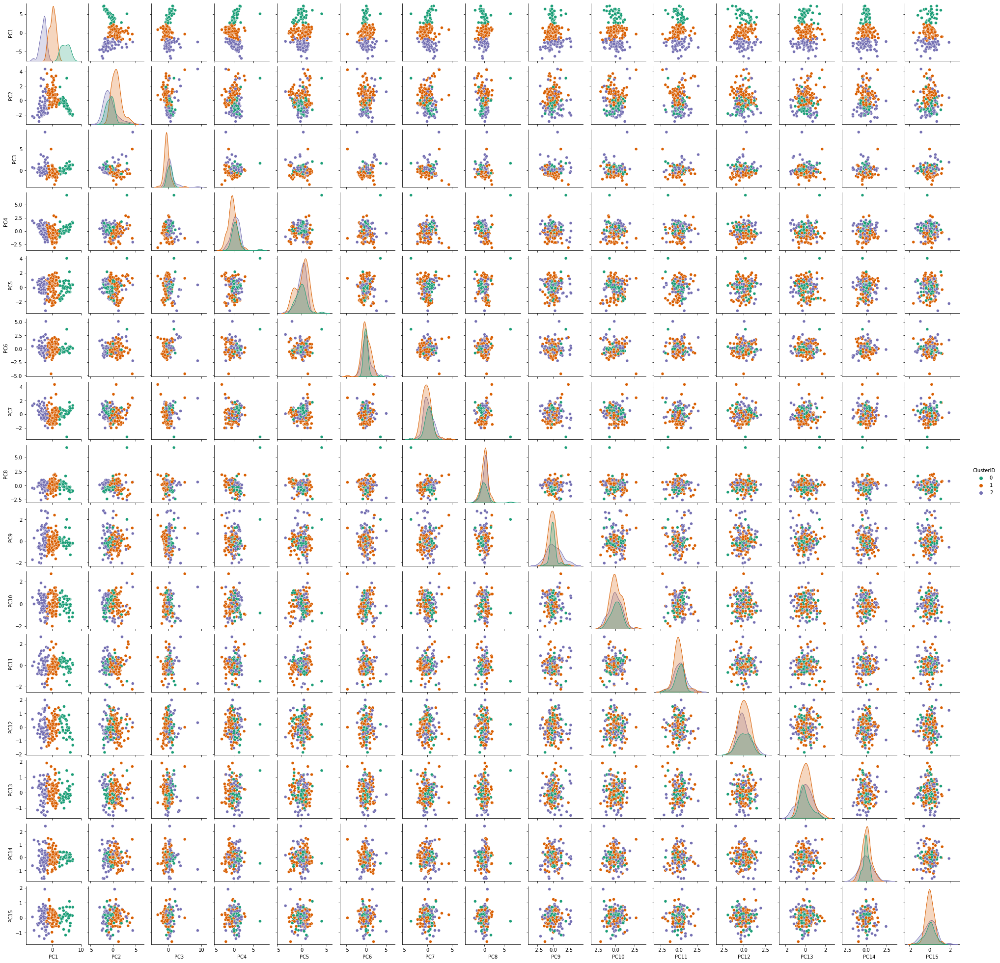

In [106]:
# Call Seaborn's pairplot to visualize our KMeans clustering on the PCA projected data

clustered_pairplot = sns.pairplot(dat_km, hue='ClusterID', palette= 'Dark2', diag_kind='kde',size=1.85)
#clustered_pairplot.figure.savefig("clustered_pairplot_out (10.01).png")

In [137]:
clustered_countries = pd.concat([total_df, pd.Series(labels)], axis=1)
clustered_countries.columns = ['Life Expectancy', 'Cigarette consumption','Alcohol consumption','Tuberculosis cases',
 'GDP_per_capita', 'Income Gini', 'Health Exp', 'Population', 'Population Density', 'PM2.5 exposure', 'Pollution Death Rate',
 'Sanitation and Drinking Water', 'Unsafe Water for Drinking', 'EPI score', 'Cardiovascular', 'Diabetes', 'Respiratory', 'Asthma',
 'Democracy Index', 'Human Development Index', 'Corruption index', 'UHC coverage', 'ClusterID']
clustered_countries['iso'] = countries['Country code']
clustered_countries

,Life Expectancy,Cigarette consumption,Alcohol consumption,Tuberculosis cases,GDP_per_capita,Income Gini,Health Exp,Population,Population Density,PM2.5 exposure,...,Cardiovascular,Diabetes,Respiratory,Asthma,Democracy Index,Human Development Index,Corruption index,UHC coverage,ClusterID,iso
0,58.095000,20.30,5.774,232.0,15015.799649,0.4410,22.638190,11381377.0,18.01,45.58,...,231.546557,6.5,19.0,4.048206,4.412,0.4330,11.0,32.0,2,SSD
1,73.651000,25.90,0.190,19.0,18003.981269,0.3680,1237.870196,18275704.0,99.52,43.76,...,491.127714,14.9,1.8,3.444039,1.430,0.5670,13.0,56.0,1,SYR
2,72.947518,11.60,7.230,47.0,7559.975039,0.3682,440.169860,72172.0,96.23,19.49,...,267.111202,11.7,1.4,7.177538,6.650,0.7420,55.0,67.0,1,DMA
3,68.002000,33.58,2.510,75.0,3476.650895,0.3682,415.198270,116255.0,166.08,11.28,...,560.229290,15.6,4.9,3.265197,6.650,0.6200,51.8,48.0,1,FSM
4,72.453000,14.90,4.160,523.0,13056.884580,0.3908,1122.642322,25887045.0,214.99,32.01,...,352.910430,8.6,2.9,3.914215,1.080,0.5796,16.0,68.0,2,PRK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,55.018000,14.70,6.190,219.0,2085.030765,0.3510,71.465730,211400704.0,232.11,71.80,...,235.652017,3.6,18.3,3.678255,4.110,0.5390,24.0,44.0,2,NGA
182,75.693170,18.80,6.430,12.0,6720.896285,0.3300,436.887180,2065092.0,81.88,29.73,...,568.703681,6.1,0.7,5.576464,6.030,0.7740,39.0,68.0,1,MKD
183,74.363000,23.20,7.010,48.0,5400.103826,0.4350,388.393250,7219641.0,18.17,11.91,...,187.905196,7.5,2.3,5.707235,5.860,0.7280,30.0,61.0,1,PRY
184,74.353660,19.60,12.340,64.0,14861.909170,0.3480,738.558170,19115146.0,83.08,14.61,...,379.626398,6.5,2.2,4.468826,6.430,0.8280,45.0,71.0,1,ROU


In [139]:
full_data = clustered_countries.merge(covid, left_on='iso', right_on='Country code')

In [141]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

full_data_sc = pd.DataFrame(scaler.fit_transform(full_data[full_data.select_dtypes(include=numerics).columns]), 
                            columns = full_data.select_dtypes(include=numerics).columns)

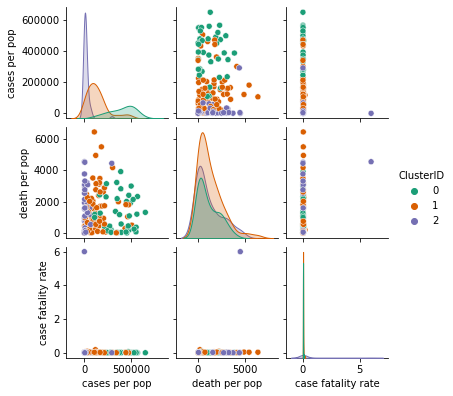

In [144]:
sns.pairplot(full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']], 
                                  hue='ClusterID', palette= 'Dark2', diag_kind='kde',size=1.85)

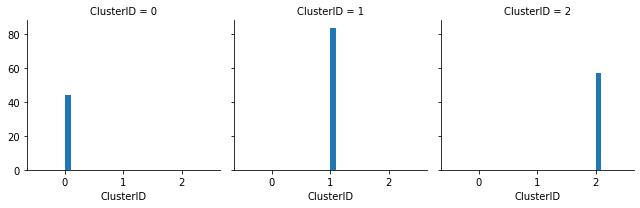

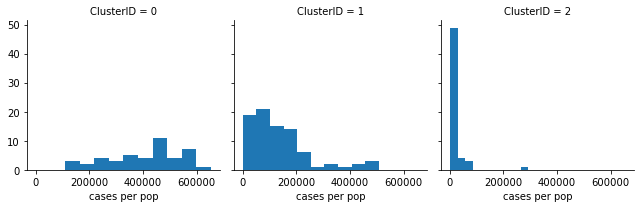

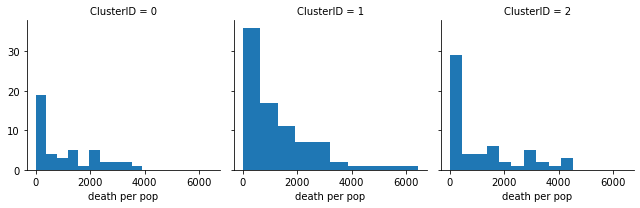

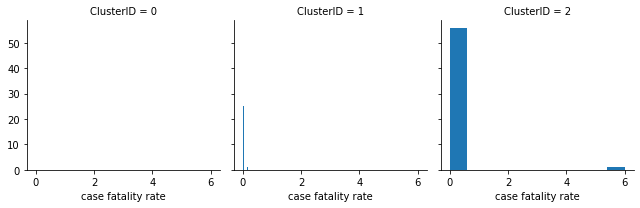

In [149]:
for c in full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']]:
    grid= sns.FacetGrid(full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']], col='ClusterID')
    grid.map(plt.hist, c)

In [151]:
full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']][full_data['ClusterID'] == 0]

,ClusterID,cases per pop,death per pop,case fatality rate
44,0,347100.45,3215.05,0.01
73,0,476048.56,2400.85,0.01
80,0,493431.68,1908.22,0.01
82,0,481154.35,216.15,0.01
83,0,481154.35,216.15,0.01
84,0,481154.35,216.15,0.01
85,0,481154.35,216.15,0.01
86,0,552840.18,79.75,0.01
87,0,552840.18,79.75,0.01
88,0,552840.18,79.75,0.01


### Decision Tree Classifier

In [163]:
full_data.iloc[:,22]

0      2
1      1
2      1
3      2
4      1
      ..
180    2
181    1
182    1
183    1
184    2
Name: ClusterID, Length: 185, dtype: int32

In [160]:
full_data.iloc[:,np.r_[0:22,25:28]]

,Life Expectancy,Cigarette consumption,Alcohol consumption,Tuberculosis cases,GDP_per_capita,Income Gini,Health Exp,Population,Population Density,PM2.5 exposure,...,Diabetes,Respiratory,Asthma,Democracy Index,Human Development Index,Corruption index,UHC coverage,cases per pop,death per pop,case fatality rate
0,58.095000,20.3,5.774,232.0,15015.799649,0.4410,22.638190,11381377.0,18.01,45.58,...,6.5,19.0,4.048206,4.412,0.4330,11.0,32.0,1658.22,769.56,0.01
1,73.651000,25.9,0.190,19.0,18003.981269,0.3680,1237.870196,18275704.0,99.52,43.76,...,14.9,1.8,3.444039,1.430,0.5670,13.0,56.0,2686.13,12.82,0.00
2,72.947518,11.6,7.230,47.0,7559.975039,0.3682,440.169860,72172.0,96.23,19.49,...,11.7,1.4,7.177538,6.650,0.7420,55.0,67.0,205104.13,939.07,0.00
3,72.453000,14.9,4.160,523.0,13056.884580,0.3908,1122.642322,25887045.0,214.99,32.01,...,8.6,2.9,3.914215,1.080,0.5796,16.0,68.0,0.04,4531.39,6.00
4,77.146000,38.9,9.400,2.3,14900.797400,0.3682,760.264950,98728.0,224.38,18.62,...,11.7,0.5,5.879424,6.650,0.7780,51.8,72.0,97500.54,1566.19,0.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,55.018000,14.7,6.190,219.0,2085.030765,0.3510,71.465730,211400704.0,232.11,71.80,...,3.6,18.3,3.678255,4.110,0.5390,24.0,44.0,1242.66,2532.17,0.01
181,75.693170,18.8,6.430,12.0,6720.896285,0.3300,436.887180,2065092.0,81.88,29.73,...,6.1,0.7,5.576464,6.030,0.7740,39.0,68.0,162891.70,752.36,0.03
182,74.363000,23.2,7.010,48.0,5400.103826,0.4350,388.393250,7219641.0,18.17,11.91,...,7.5,2.3,5.707235,5.860,0.7280,30.0,61.0,106813.91,6421.80,0.03
183,74.353660,19.6,12.340,64.0,14861.909170,0.3480,738.558170,19115146.0,83.08,14.61,...,6.5,2.2,4.468826,6.430,0.8280,45.0,71.0,168812.83,2612.07,0.02


In [197]:
"""X = full_data.iloc[:,np.r_[0:22,25:28]].values
y = full_data.iloc[:,22].values"""

X = full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']].iloc[:,[1,2,3]].values
y = full_data[['ClusterID', 'cases per pop', 'death per pop', 'case fatality rate']].iloc[:,0].values

In [198]:
y,class_names = pd.factorize(y)

In [199]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify=y, random_state = 42)

In [200]:
# Fitting Classifier to the Training Set
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion='entropy',max_depth=3, random_state=42)
classifier.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

In [201]:
# Model performance on training set
y_pred_train =classifier.predict(X_train)

from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report

accuracy = metrics.accuracy_score(y_train, y_pred_train)
print("Accuracy: {:.2f}".format(accuracy))
cm=confusion_matrix(y_train,y_pred_train)
print('Confusion Matrix: \n', cm)
print(classification_report(y_train, 
                            y_pred_train,
                            target_names=list(map(str, class_names.tolist()))
                           ))

Accuracy: 0.86
Confusion Matrix: 
 [[40  6  0]
 [ 6 55  6]
 [ 0  2 33]]
              precision    recall  f1-score   support

           2       0.87      0.87      0.87        46
           1       0.87      0.82      0.85        67
           0       0.85      0.94      0.89        35

    accuracy                           0.86       148
   macro avg       0.86      0.88      0.87       148
weighted avg       0.87      0.86      0.86       148



In [202]:
# Predicting the test results
y_pred=classifier.predict(X_test)

# Classification results on test set
from sklearn import metrics
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))

from sklearn.metrics import confusion_matrix, classification_report
cm=confusion_matrix(y_test,y_pred)
print('Confusion Matrix: \n', cm)
print(classification_report(y_test, 
                            y_pred, 
                            target_names=list(map(str, class_names.tolist()))
                           ))

Accuracy: 0.73
Confusion Matrix: 
 [[10  1  0]
 [ 3 11  3]
 [ 0  3  6]]
              precision    recall  f1-score   support

           2       0.77      0.91      0.83        11
           1       0.73      0.65      0.69        17
           0       0.67      0.67      0.67         9

    accuracy                           0.73        37
   macro avg       0.72      0.74      0.73        37
weighted avg       0.73      0.73      0.73        37



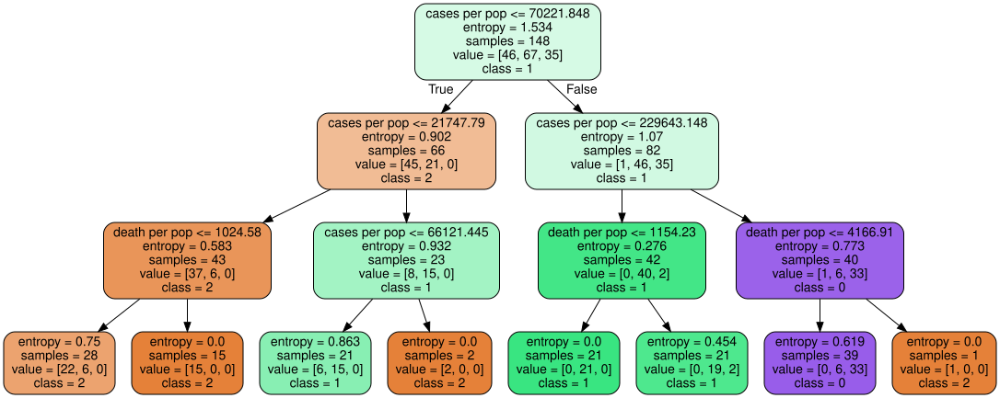

In [204]:
# Visualize the tree by graphiz

import os
os.environ["PATH"] += os.pathsep + 'C:\\Program Files\\Graphviz\\bin'
#C:\Program Files\Graphviz
import graphviz
from sklearn import tree
"""feature_names = ['Life Expectancy', 'Cigarette consumption','Alcohol consumption','Tuberculosis cases',
 'GDP_per_capita', 'Income Gini', 'Health Exp', 'Population', 'Population Density', 'PM2.5 exposure', 'Pollution Death Rate',
 'Sanitation and Drinking Water', 'Unsafe Water for Drinking', 'EPI score', 'Cardiovascular', 'Diabetes', 'Respiratory', 'Asthma',
 'Democracy Index', 'Human Development Index', 'Corruption index', 'UHC coverage', 'cases per pop', 'death per pop', 'case fatality rate']"""
feature_names = ['cases per pop', 'death per pop', 'case fatality rate']
dot_data = tree.export_graphviz(classifier, 
                                out_file=None, 
                                filled=True, 
                                rounded = True, 
                                feature_names=feature_names, 
                                class_names=['2','1','0']
                               )
graph = graphviz.Source(dot_data)
graph

In [40]:
combo = combo[combo['iso'].isin(covid['Country code'])]

In [41]:
combo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 181 entries, 0 to 185
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Socio-economic      181 non-null    float64
 1   Disease Prevalence  181 non-null    float64
 2   Environmental       181 non-null    float64
 3   Political           181 non-null    float64
 4   Categorical         181 non-null    float64
 5   iso                 181 non-null    object 
dtypes: float64(5), object(1)
memory usage: 9.9+ KB


In [42]:
from sklearn import linear_model
import statsmodels.api as sm

x = combo.iloc[:,:4]
#y = covid['cases per pop']
y = combo.Categorical

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 
 
print_model = model.summary()
print(print_model)

                                 OLS Regression Results                                
Dep. Variable:            Categorical   R-squared (uncentered):                   0.986
Model:                            OLS   Adj. R-squared (uncentered):              0.986
Method:                 Least Squares   F-statistic:                              3106.
Date:                Tue, 27 Sep 2022   Prob (F-statistic):                   1.02e-162
Time:                        13:42:55   Log-Likelihood:                         -606.23
No. Observations:                 181   AIC:                                      1220.
Df Residuals:                     177   BIC:                                      1233.
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------

In [43]:
x = x.drop(columns = ["Socio-economic"])

model = sm.OLS(y, x).fit()
predictions = model.predict(x) 
 
print_model = model.summary()
print(print_model)

                                 OLS Regression Results                                
Dep. Variable:            Categorical   R-squared (uncentered):                   0.986
Model:                            OLS   Adj. R-squared (uncentered):              0.986
Method:                 Least Squares   F-statistic:                              4164.
Date:                Tue, 27 Sep 2022   Prob (F-statistic):                   1.46e-164
Time:                        13:47:16   Log-Likelihood:                         -606.23
No. Observations:                 181   AIC:                                      1218.
Df Residuals:                     178   BIC:                                      1228.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------

## PCA for categories performance assessment

In [ ]:
from scipy.stats import norm

def pca(df, title, switch=0):
    C = df.corr()
    n = len(C)
    plt.figure(figsize=(30, 30))
    plt.matshow(C)
    plt.colorbar()
    plt.xticks(np.arange(n), df.columns, rotation=90)
    plt.yticks(np.arange(n), df.columns, rotation=0)
    plt.title(title)
    plt.show()

    l, U = np.linalg.eig(C)
    indices = np.argsort(l)[::-1]
    l = l[indices]
    U = np.real(U)[:,indices][indices,:]*(-1)**switch
    pca_weights = np.round(np.real(l) / n * 100, 1)
    print(f'The contributions of principal components are: {pca_weights}')

    C['Weights'] = U[:, 0]
    print(C['Weights'])

    plt.figure(figsize=(15, 10))
    plt.scatter(U[:,0], U[:,1])
    for i in range(n):
        plt.annotate(df.columns[i], (U[i,0], U[i, 1]), rotation=15)

    plt.title(title)
    plt.show()

    df_norm = (df - df.mean())/df.std()
    coords = df_norm @ np.real(U[:,:2])
    
    x = coords.iloc[:,0]
    y = coords.iloc[:,1]

    plt.figure(figsize=(21, 15))

    plt.scatter(x, y)
    for i in range(len(x)):
        plt.annotate(df.index[i], (x[i], y[i]), rotation=0)

    plt.title(title)
    plt.show()

    coords['Percentile'] = norm.cdf((coords[0] - coords[0].mean())/coords[0].std()) * 100
    print(coords.sort_values(0, ascending=False))
    return coords.loc[:,[0, 'Percentile']]

cf = {}
pf = {}
for category, factors in categories.items():
    cf[category] = pca(df[factors], category, switch=(category!='Political')).loc[:,0]
    pf[category] = pca(df[factors], category, switch=(category!='Political')).loc[:,'Percentile']

cf = pd.DataFrame(cf)
pf = pd.DataFrame(pf)

In [ ]:
ranking_cat = pca(cf, 'Showdown', switch=1)

In [ ]:
combo = pf.copy()
#combo['Categorical'] = ranking_cat['Percentile']
combo

In [ ]:
pf

In [ ]:
combo = pd.concat([combo, pd.DataFrame({'cluster':labels})], axis=1)

In [ ]:
combo['iso'] = countries['Country code']